Importing the modules

# Welcome to the notebook 🙂

### Task 1 - Importing the Dataset

In [1]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

print("Modules are imported!")

2024-07-09 00:56:21.026374: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Modules are imported!


In [2]:
df = pd.read_csv("Creditcard_dataset.csv")

Check the data shape

In [3]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,10,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,10,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,11,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50492 entries, 0 to 50491
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    50492 non-null  int64  
 1   V1      50492 non-null  float64
 2   V2      50492 non-null  float64
 3   V3      50492 non-null  float64
 4   V4      50492 non-null  float64
 5   V5      50492 non-null  float64
 6   V6      50492 non-null  float64
 7   V7      50492 non-null  float64
 8   V8      50492 non-null  float64
 9   V9      50492 non-null  float64
 10  V10     50492 non-null  float64
 11  V11     50492 non-null  float64
 12  V12     50492 non-null  float64
 13  V13     50492 non-null  float64
 14  V14     50492 non-null  float64
 15  V15     50492 non-null  float64
 16  V16     50492 non-null  float64
 17  V17     50492 non-null  float64
 18  V18     50492 non-null  float64
 19  V19     50492 non-null  float64
 20  V20     50492 non-null  float64
 21  V21     50492 non-null  float64
 22

In [5]:
df.Class.value_counts()

0    50000
1      492
Name: Class, dtype: int64

Let's see how many genuine and limited fraudulent records we have

### Task 2 - Data Preprocessing and Exploration

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels
*   Data Exploration


Removing the rows `Nan` values in the dataset

In [6]:
df.dropna(inplace = True)

In [7]:
df.shape

(50492, 31)

Removing Time column

In [ ]:
df = df.drop(axis = 1, columns = 'Time')

In [10]:
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Feature Scaling of Amount column

In [11]:
scaler = StandardScaler()
df['Amount'] = scaler.fit_transform(df[['Amount']])

In [12]:
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Let's split the genuine and fraud records into separate dataframes

In [13]:
df_fraud = df[df.Class == 1]
df_genuine = df[df.Class == 0]

In [14]:
df_fraud.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
50000,-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,-2.772272,...,0.517232,-0.035049,-0.465211,0.320198,0.044519,0.177840,0.261145,-0.143276,-0.372497,1
50001,-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,-0.838587,...,0.661696,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,1.866017,1
50002,-2.303350,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.562320,-0.399147,-0.238253,-1.525412,...,-0.294166,-0.932391,0.172726,-0.087330,-0.156114,-0.542628,0.039566,-0.153029,0.642790,1
50003,-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,-4.801637,...,0.573574,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,-0.122833,1
50004,1.234235,3.019740,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,-2.447469,...,-0.379068,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,-0.368265,1


In [15]:
df_genuine.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Split the data into features and labels

In [16]:
X = df.drop(axis=1, columns='Class')
y = df.Class

Data Exploration
  - Apply PCA to reduce the dimensionality of features `X` into two dimensions
  - Use a scatter plot to visualize our data

In [18]:
pca = PCA(2)
transformed_data = pca.fit_transform(X)
transformed_df = pd.DataFrame(transformed_data)
transformed_df['label'] = y
transformed_df.head()

,0,1,label
0,-0.447840,1.197606,0
1,-0.582391,0.258357,0
2,-0.939391,-0.728340,0
3,-0.630764,-0.499025,0
4,-0.536286,-1.055337,0


Let's Use a scatter plot to visualize our data

In [21]:
px.scatter(transformed_df, x=0, y=1, color = transformed_df.label.astype(str))

### Task 3 - Building the Generator Model

Write a method to create the Generator model architecture

In [42]:
def build_generator():
    model = Sequential()
    
    model.add(Dense(32, activation = 'relu', input_dim = 29, kernel_initializer = 'he_uniform'))
    model.add(BatchNormalization())
    model.add(Dense(64, activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(128, activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(29, activation = 'linear'))
    model.summary()
    
    return model

build_generator()


Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_115 (Dense)           (None, 32)                960       
                                                                 
 batch_normalization_35 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_116 (Dense)           (None, 64)                2112      
                                                                 
 batch_normalization_36 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_117 (Dense)           (None, 128)               8320      
                                                                 
 batch_normalization_37 (Bat  (None, 128)            

### Task 4 - Building the Discriminator Model

Write a method to create the Discriminator model architecture

In [25]:
def build_discriminator():
    
    model = Sequential()
    
    model.add(Dense(128, input_dim = 29, activation = 'relu', kernel_initializer = 'he_uniform'))
    
    model.add(Dense(64, activation = 'relu'))
    model.add(Dense(32, activation = 'relu'))
    model.add(Dense(32, activation = 'relu'))
    model.add(Dense(16, activation = 'relu'))
    
    model.add(Dense(1, activation = 'sigmoid'))
    
    model.compile(optimizer = 'adam', loss='binary_crossentropy')
    model.summary()
    return model

build_discriminator()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 128)               3840      
                                                                 
 dense_10 (Dense)            (None, 64)                8256      
                                                                 
 dense_11 (Dense)            (None, 32)                2080      
                                                                 
 dense_12 (Dense)            (None, 32)                1056      
                                                                 
 dense_13 (Dense)            (None, 16)                528       
                                                                 
 dense_14 (Dense)            (None, 1)                 17        
                                                                 
Total params: 15,777
Trainable params: 15,777
Non-trai

### Task 5 - Combine Generator and Discriminator models to Build The GAN

In [32]:
def build_gan(generator, discriminitor):
    discriminator.trainable = False
    gan_input = Input(shape = (generator.input_shape[1],))
    x = generator(gan_input)

    gan_output = discriminitor(x)
    gan = Model(gan_input,gan_output)
    gan.summary()
    return gan

Let's create a method that generates synthetic data using the Generator

In [27]:
def generate_synthetic_data(generator, num_samples):
    noise = np.random.normal(0,1, (num_samples, generator.input_shape[1]))
    fake_data = generator.predict(noise)
    return fake_data

### Task 6 - Train and evaluate our GAN
*    Defining some variables
*    Creating our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA




In [40]:
def monitor_generator(generator):
    # Initialize a PCA (Principal Component Analysis) object with 2 components
    pca = PCA(n_components=2)

    # Drop the 'Class' column from the fraud dataset to get real data
    real_fraud_data = df_fraud.drop("Class", axis=1)

    # Transform the real fraud data using PCA
    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    # Create a DataFrame for the transformed real data and add a 'label' column with the value 'real'
    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    # Generate synthetic fraud data using the provided generator and specify the number of samples (492 in this case)
    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    # Transform the synthetic fraud data using PCA
    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components as x and y, respectively,
    # and color points based on the 'label' column, with a size of 10
    plt.figure()
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_129 (Dense)           (None, 32)                960       
                                                                 
 batch_normalization_41 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_130 (Dense)           (None, 64)                2112      
                                                                 
 batch_normalization_42 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_131 (Dense)           (None, 128)               8320      
                                                                 
 batch_normalization_43 (Bat  (None, 128)            

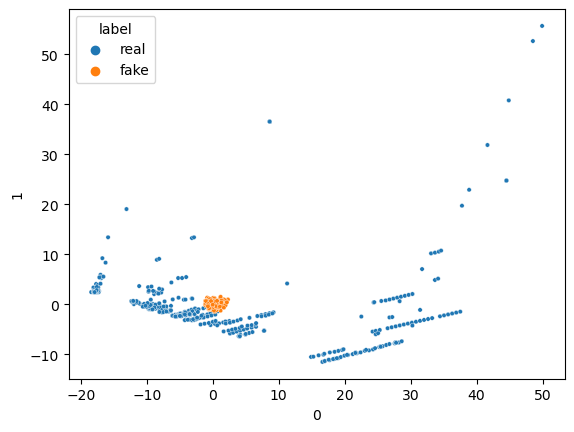

16/16 [==============================] - 0s 6ms/step


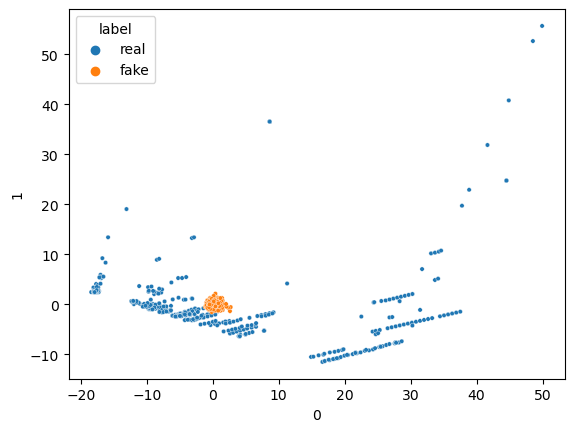

16/16 [==============================] - 0s 969us/step


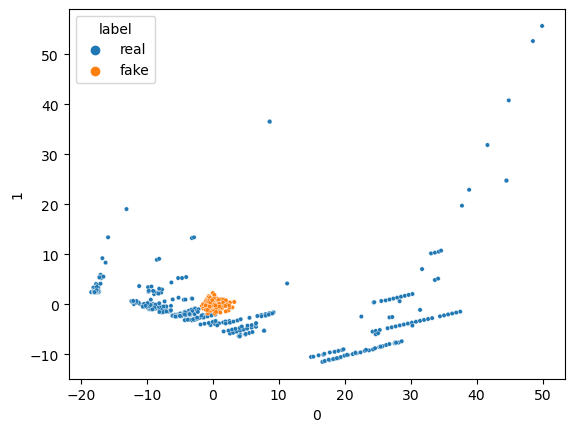

16/16 [==============================] - 0s 896us/step


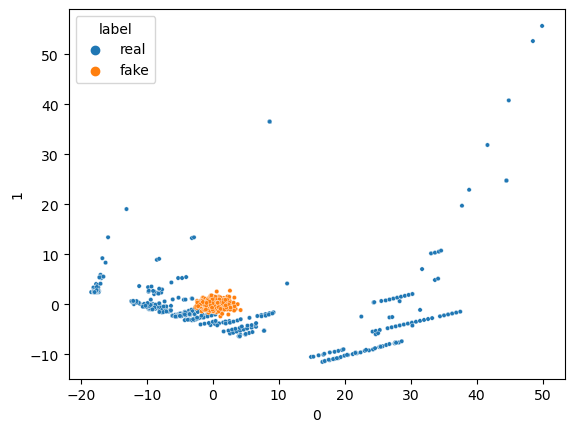

16/16 [==============================] - 0s 6ms/step


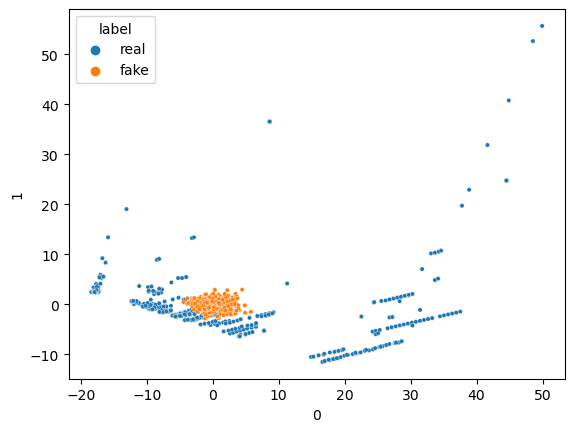

16/16 [==============================] - 0s 6ms/step


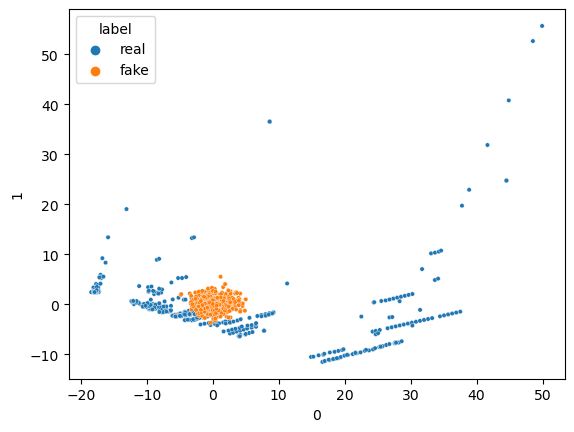

16/16 [==============================] - 0s 817us/step


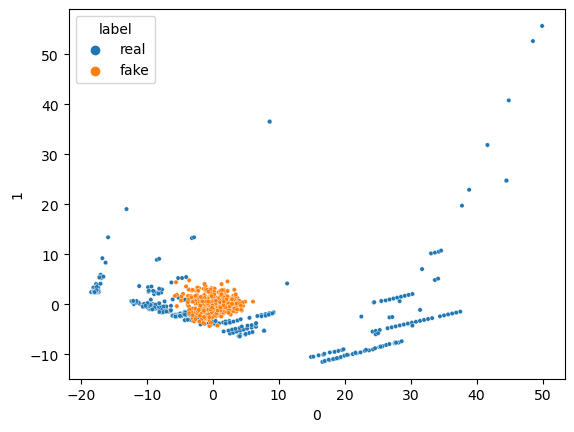

16/16 [==============================] - 0s 816us/step


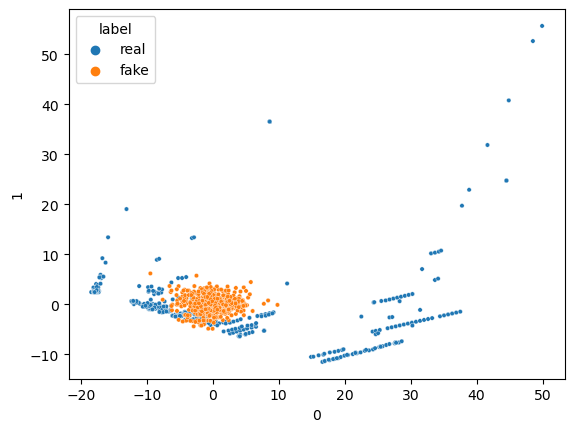

16/16 [==============================] - 0s 840us/step


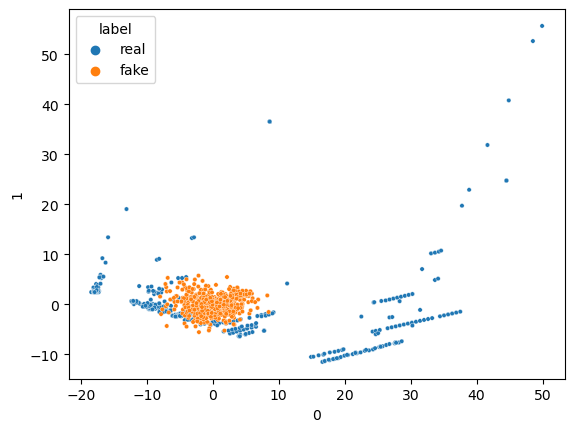

16/16 [==============================] - 0s 6ms/step


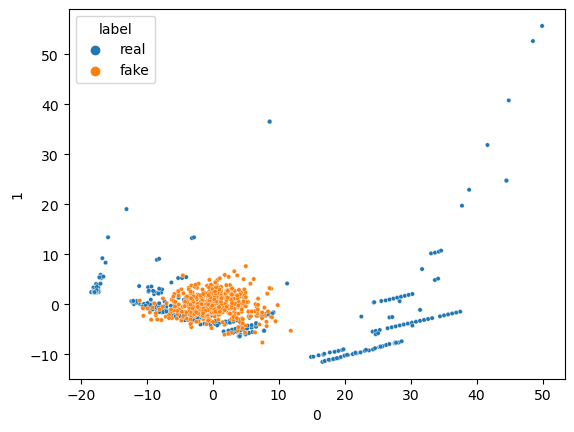

16/16 [==============================] - 0s 6ms/step


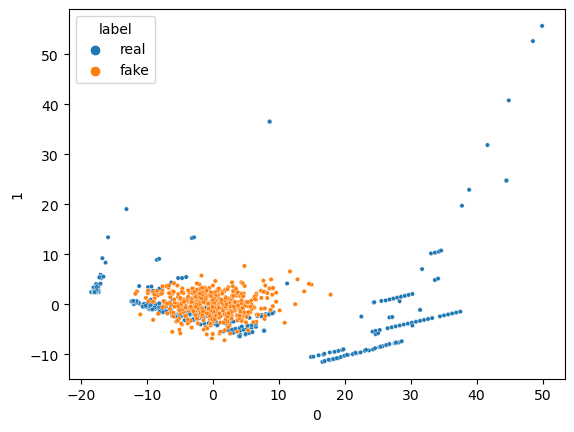

16/16 [==============================] - 0s 887us/step


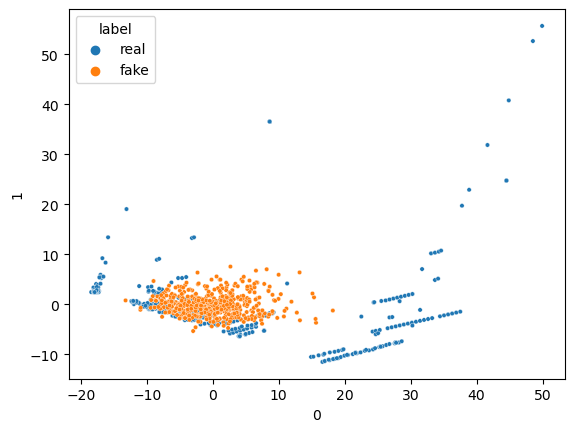

16/16 [==============================] - 0s 834us/step


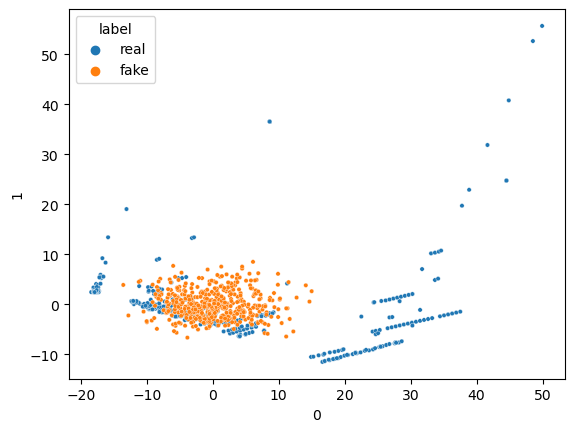

16/16 [==============================] - 0s 6ms/step


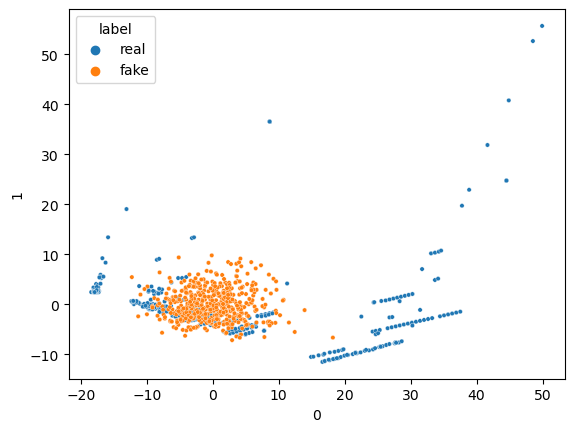

16/16 [==============================] - 0s 853us/step


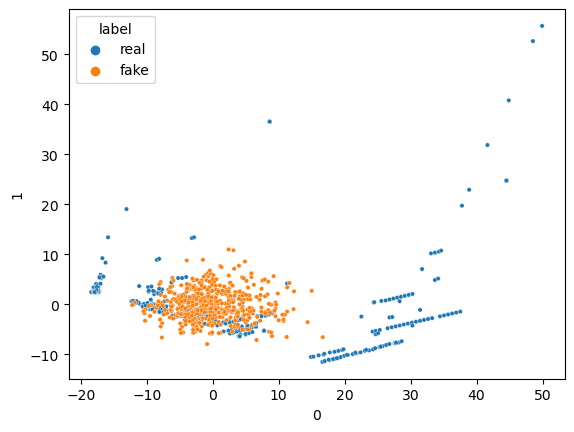

16/16 [==============================] - 0s 846us/step


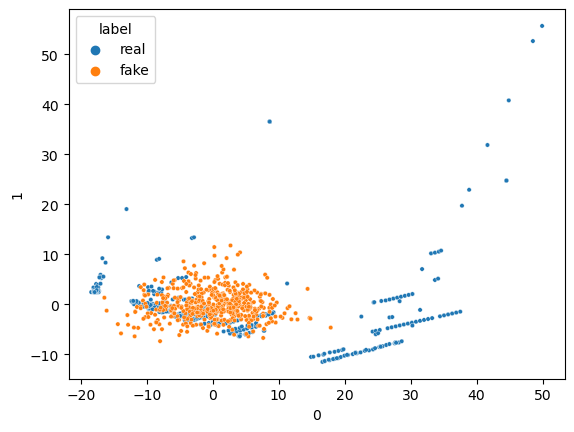

16/16 [==============================] - 0s 811us/step


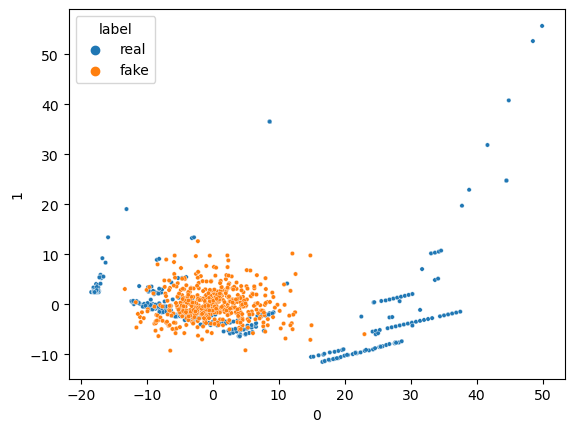

16/16 [==============================] - 0s 880us/step


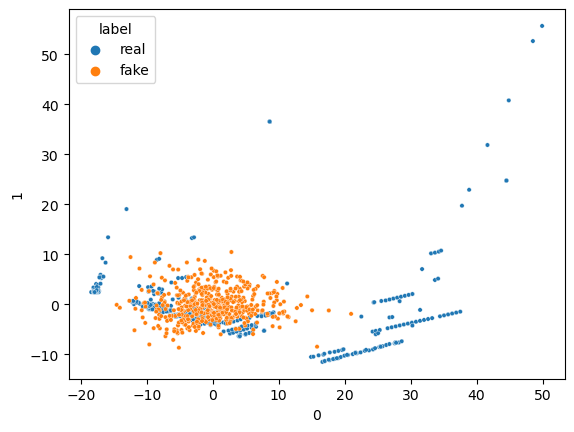

16/16 [==============================] - 0s 6ms/step


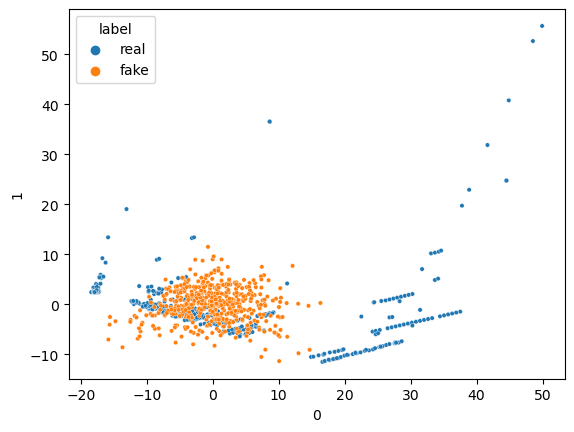

16/16 [==============================] - 0s 6ms/step


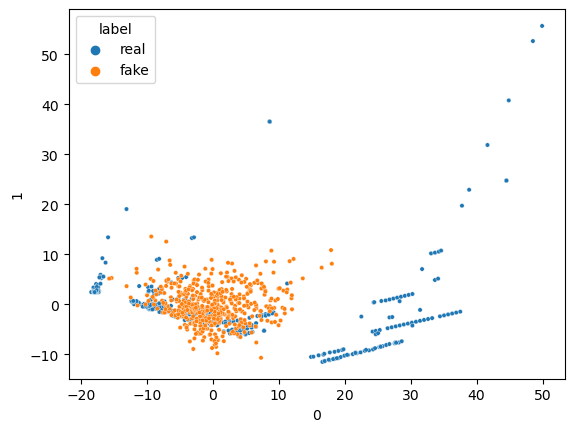

16/16 [==============================] - 0s 863us/step


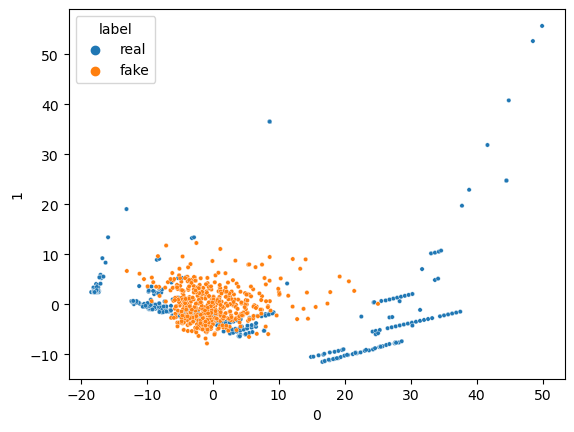

16/16 [==============================] - 0s 866us/step


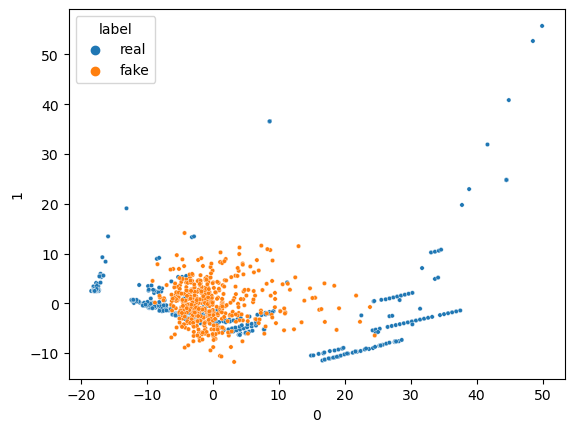

16/16 [==============================] - 0s 6ms/step


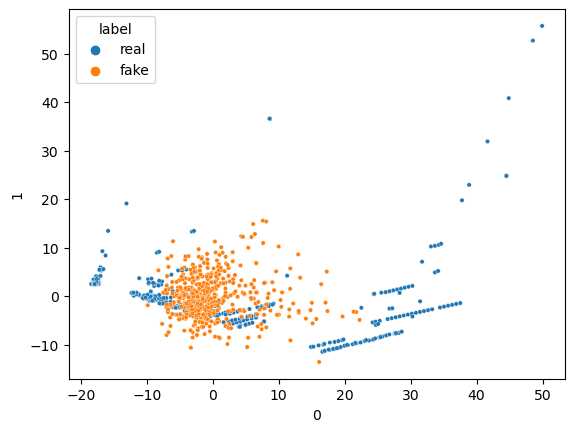

16/16 [==============================] - 0s 863us/step


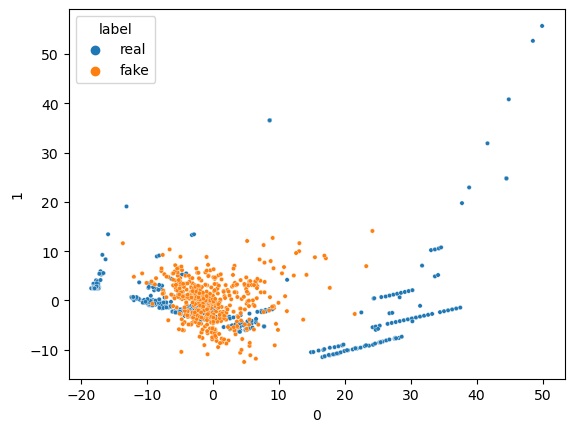

16/16 [==============================] - 0s 857us/step


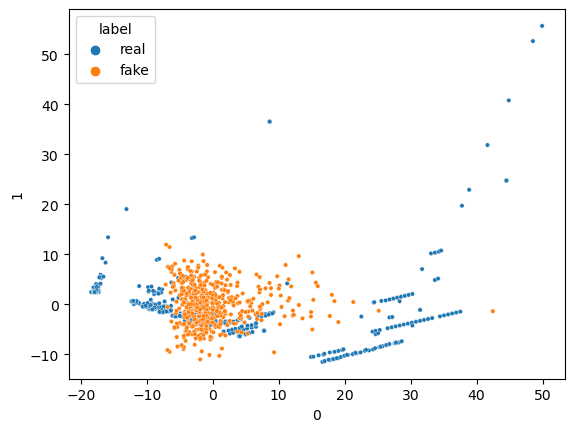

16/16 [==============================] - 0s 764us/step


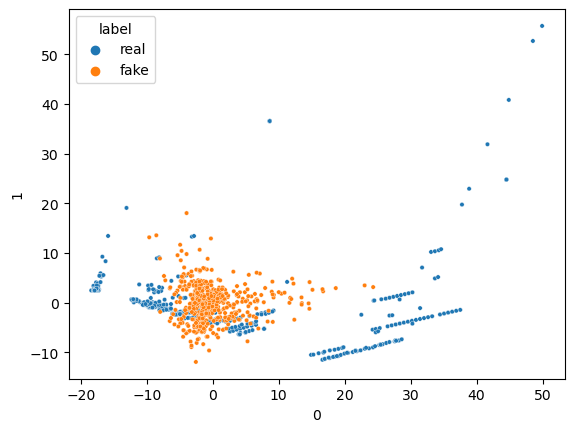

16/16 [==============================] - 0s 853us/step


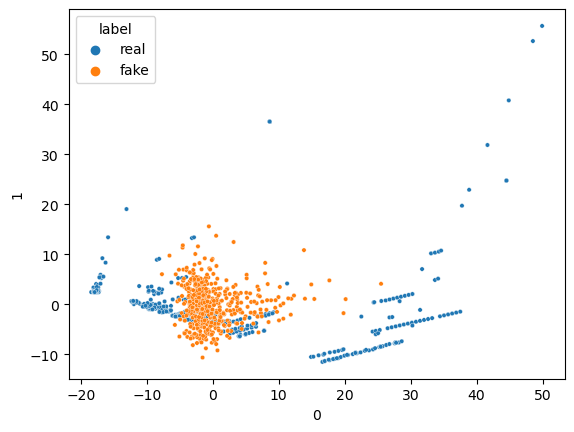

16/16 [==============================] - 0s 833us/step


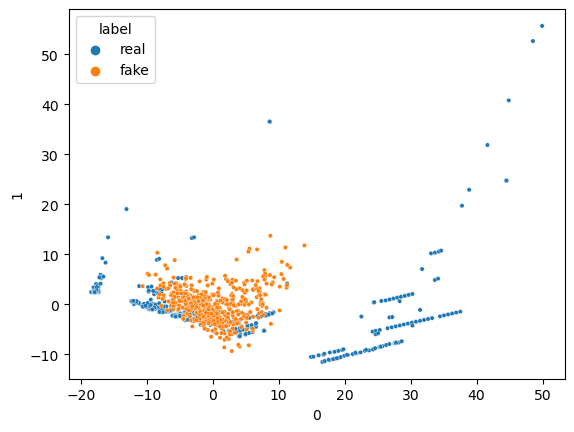

16/16 [==============================] - 0s 6ms/step


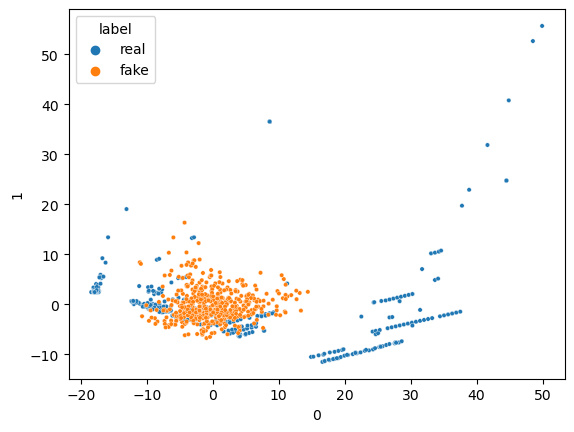

16/16 [==============================] - 0s 862us/step


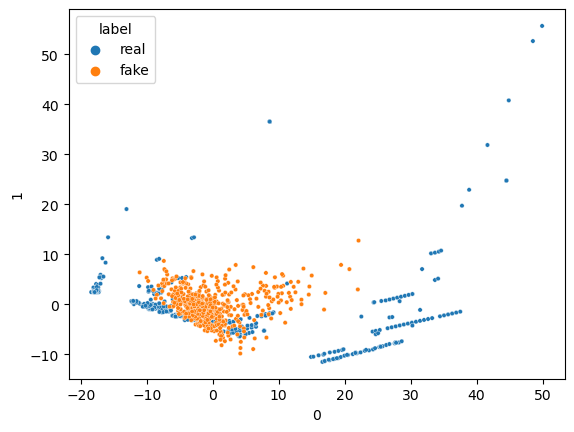

16/16 [==============================] - 0s 841us/step


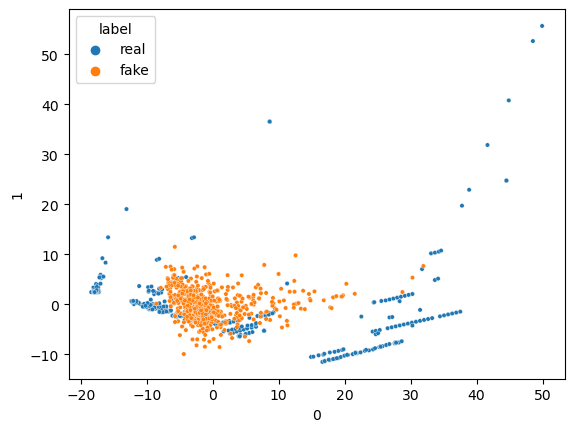

16/16 [==============================] - 0s 829us/step


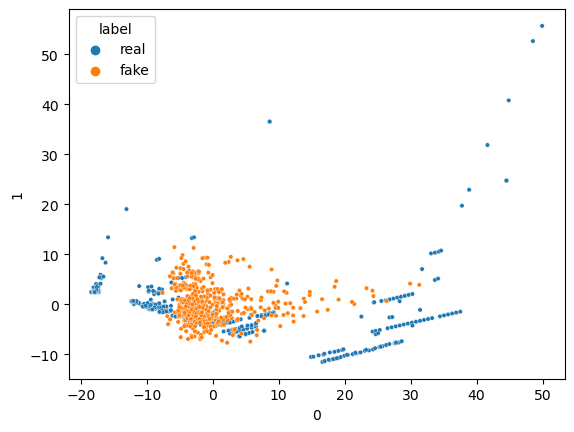

16/16 [==============================] - 0s 6ms/step


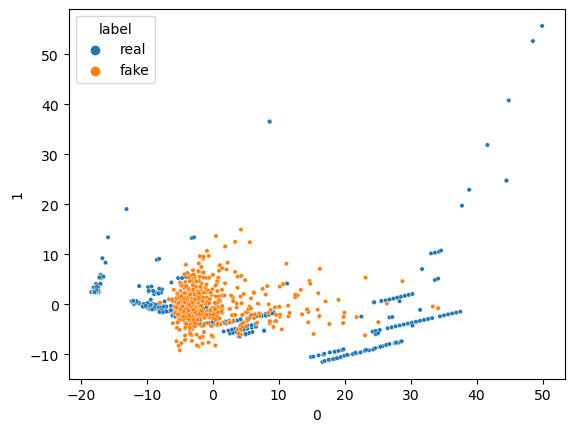

16/16 [==============================] - 0s 6ms/step


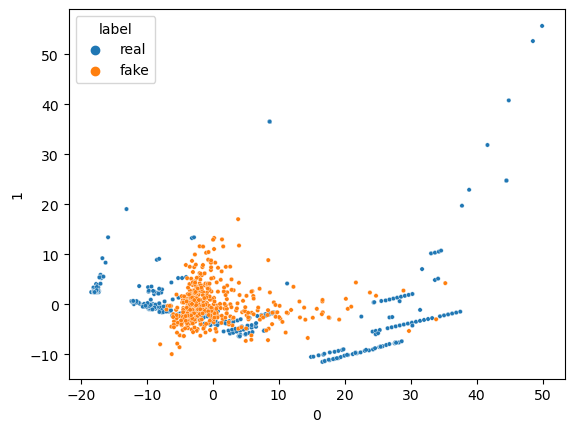

16/16 [==============================] - 0s 6ms/step


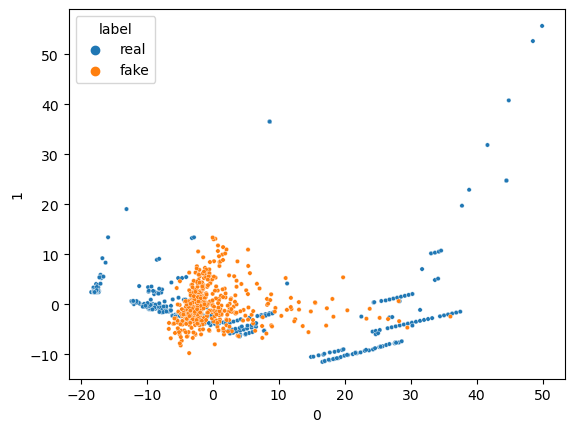

16/16 [==============================] - 0s 6ms/step


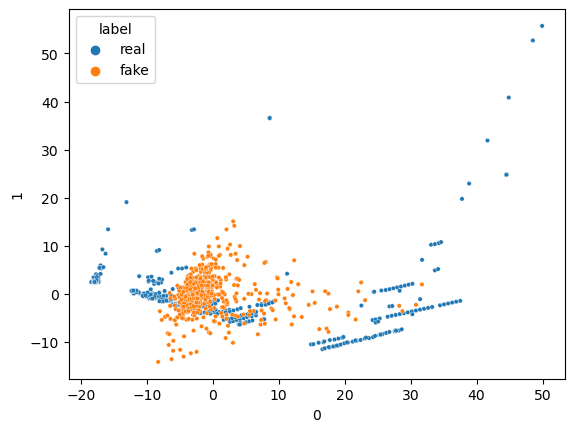

16/16 [==============================] - 0s 820us/step


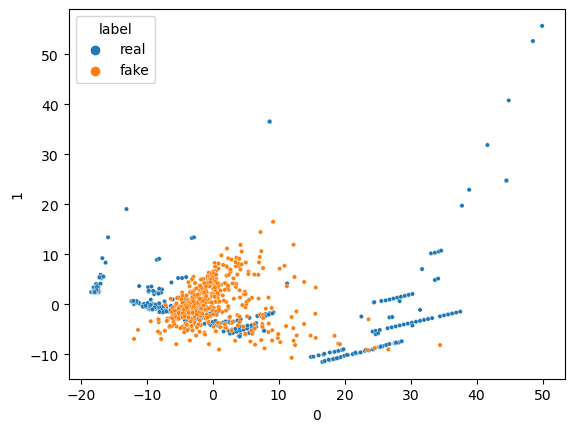

16/16 [==============================] - 0s 6ms/step


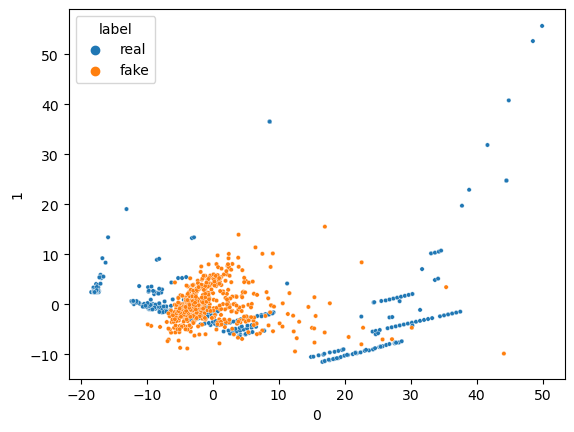

16/16 [==============================] - 0s 835us/step


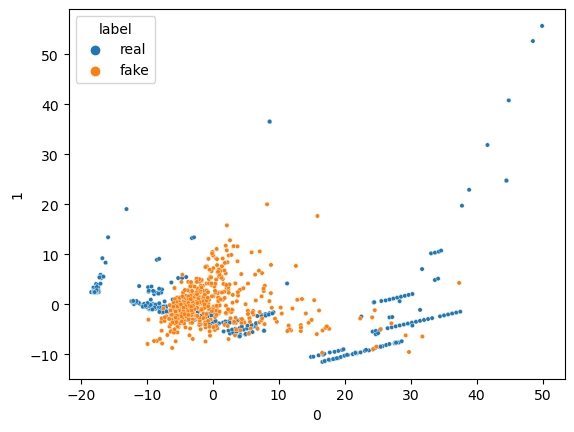

16/16 [==============================] - 0s 861us/step


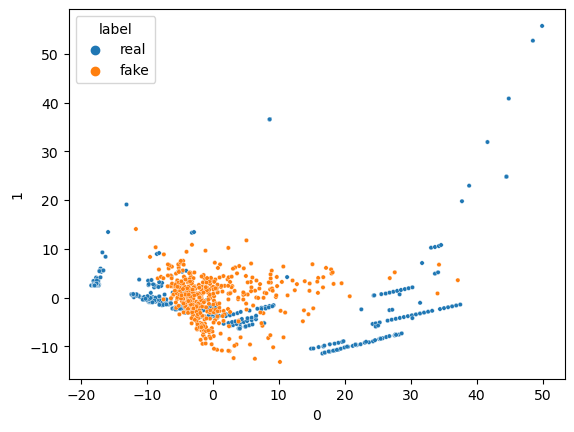

16/16 [==============================] - 0s 6ms/step


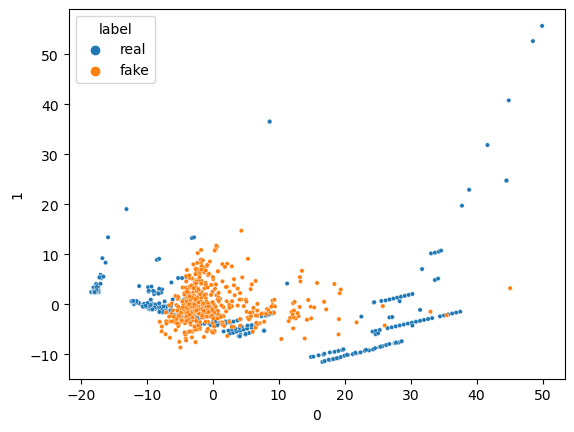

16/16 [==============================] - 0s 864us/step


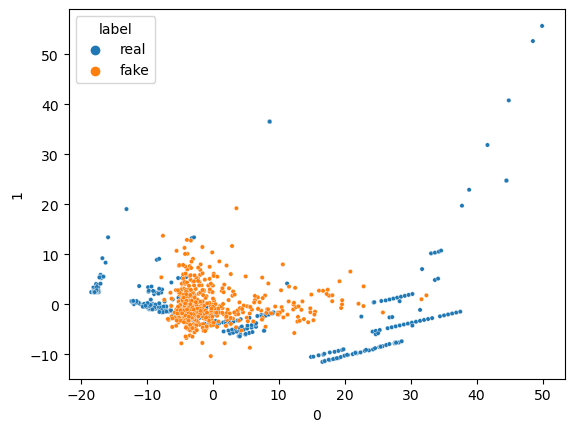

16/16 [==============================] - 0s 895us/step


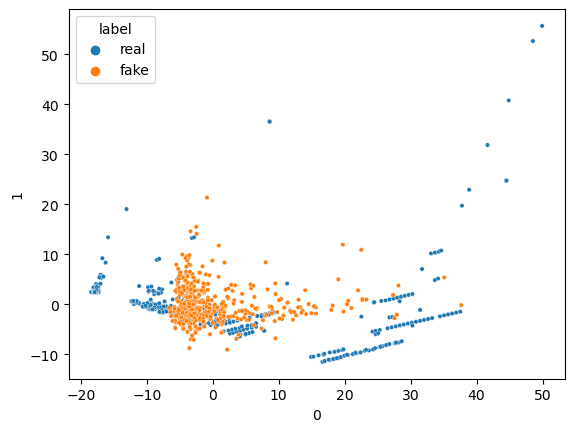

16/16 [==============================] - 0s 825us/step


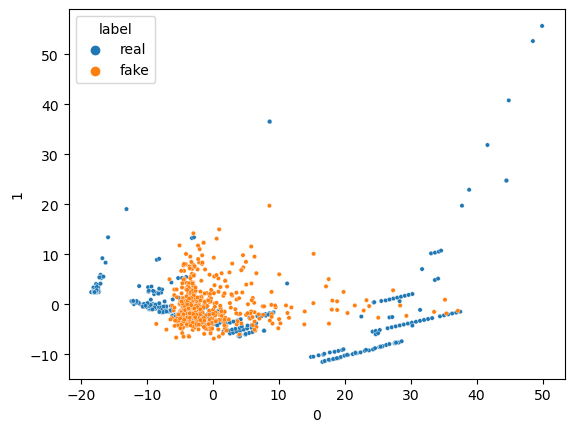

16/16 [==============================] - 0s 831us/step


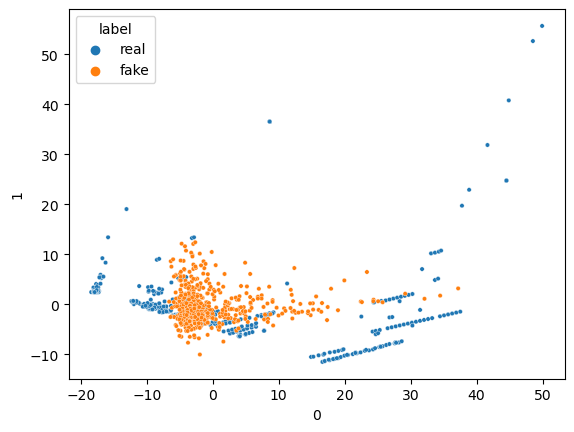

16/16 [==============================] - 0s 844us/step


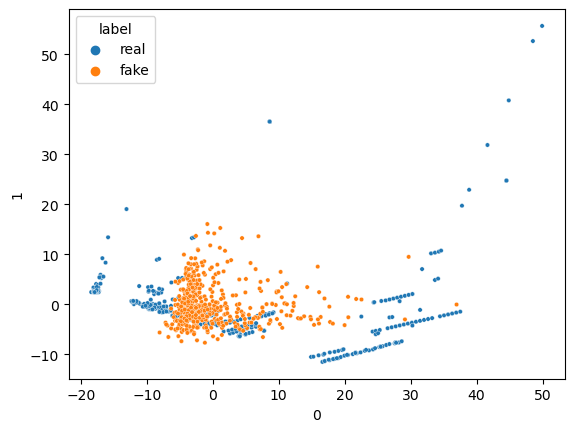

16/16 [==============================] - 0s 772us/step


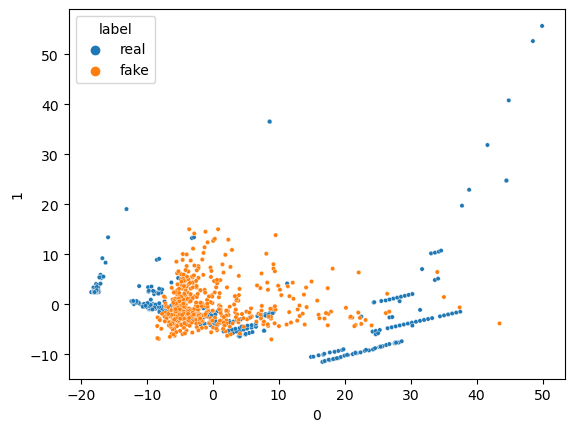

16/16 [==============================] - 0s 6ms/step


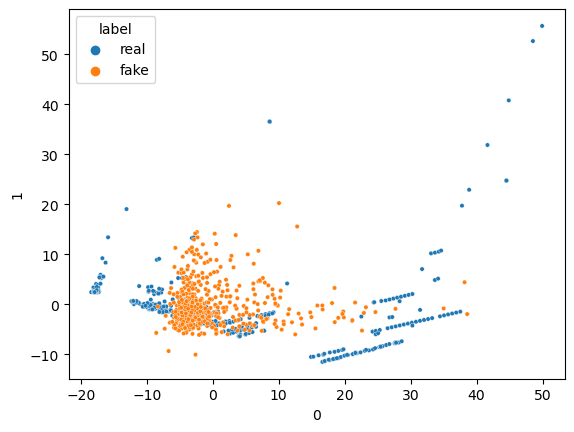

16/16 [==============================] - 0s 971us/step


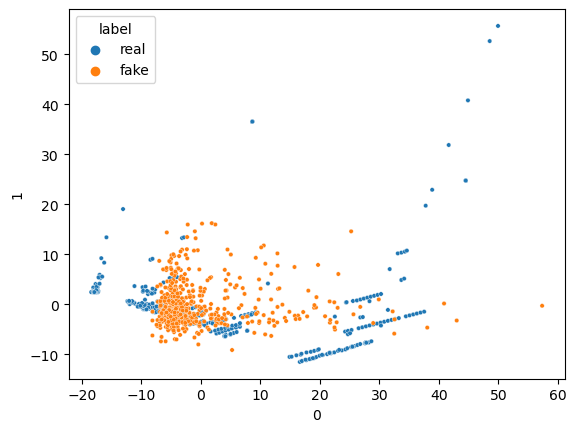

16/16 [==============================] - 0s 6ms/step


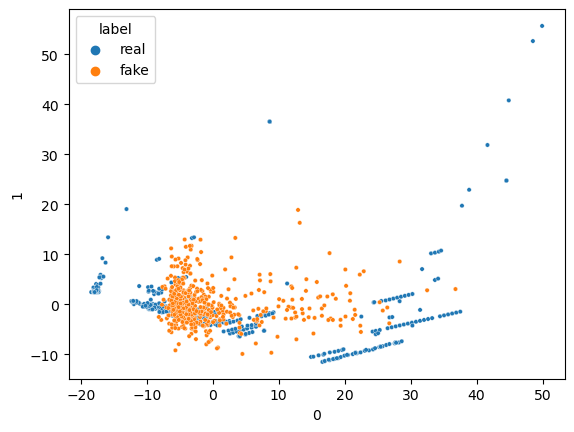

16/16 [==============================] - 0s 839us/step


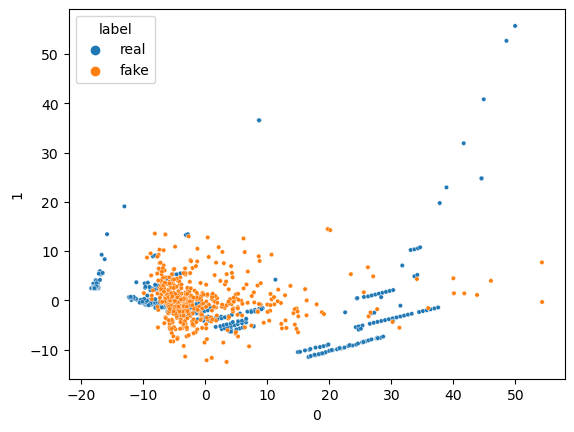

16/16 [==============================] - 0s 868us/step


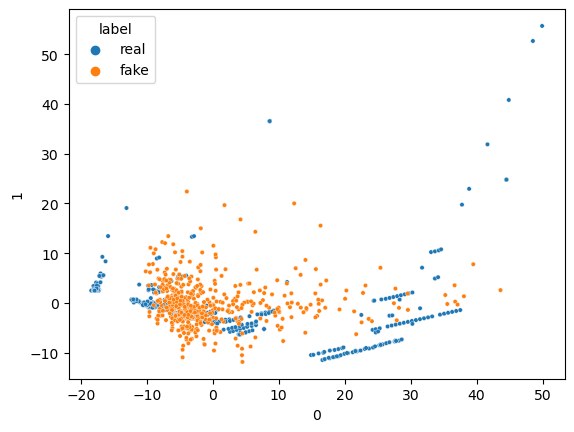

16/16 [==============================] - 0s 792us/step


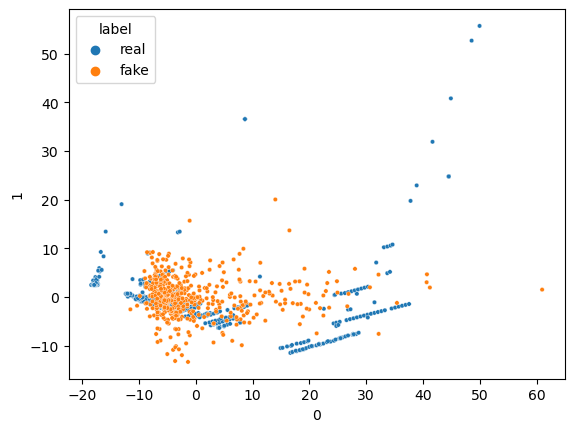

16/16 [==============================] - 0s 828us/step


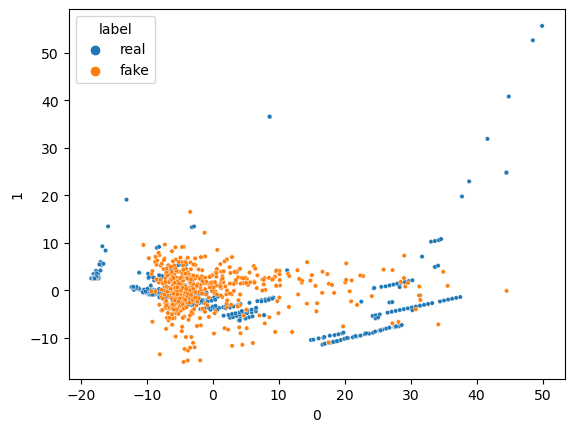

16/16 [==============================] - 0s 804us/step


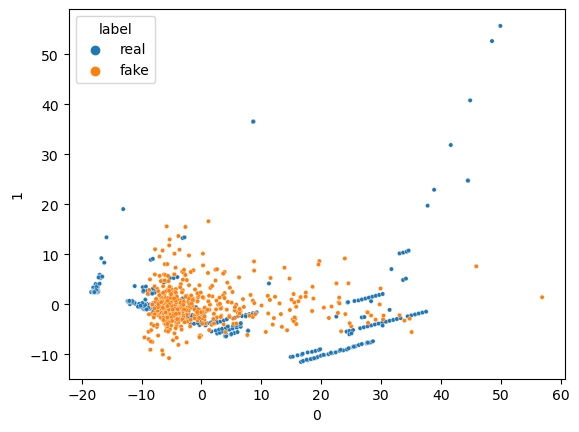

16/16 [==============================] - 0s 911us/step


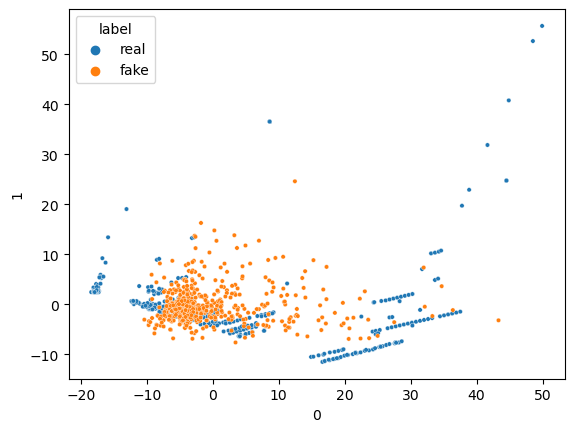

16/16 [==============================] - 0s 796us/step


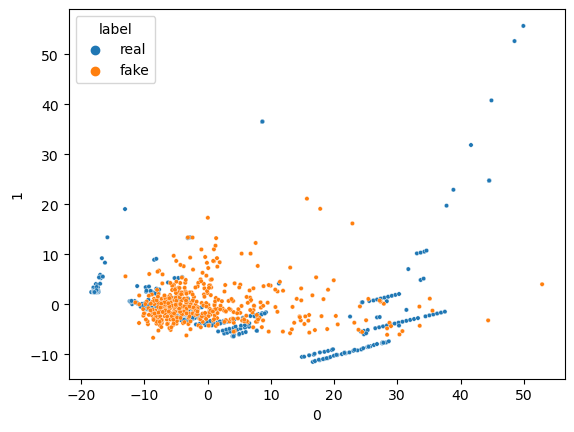

16/16 [==============================] - 0s 6ms/step


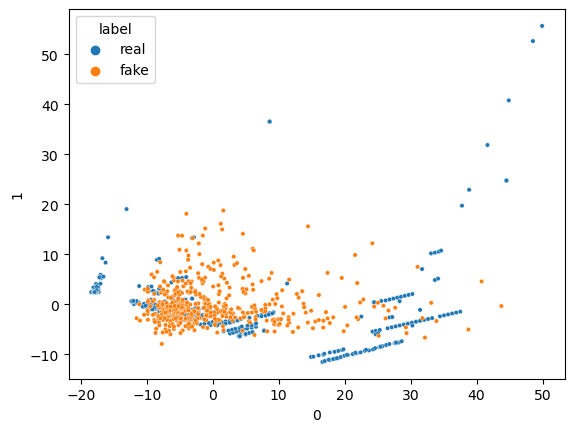

16/16 [==============================] - 0s 6ms/step


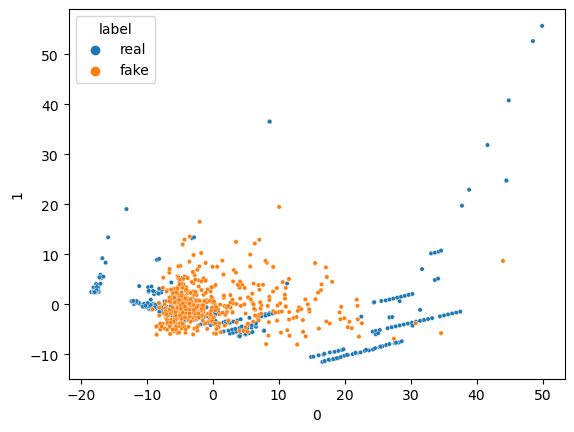

16/16 [==============================] - 0s 880us/step


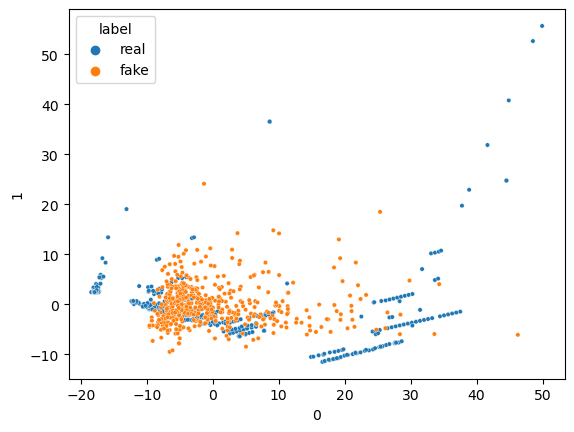

16/16 [==============================] - 0s 882us/step


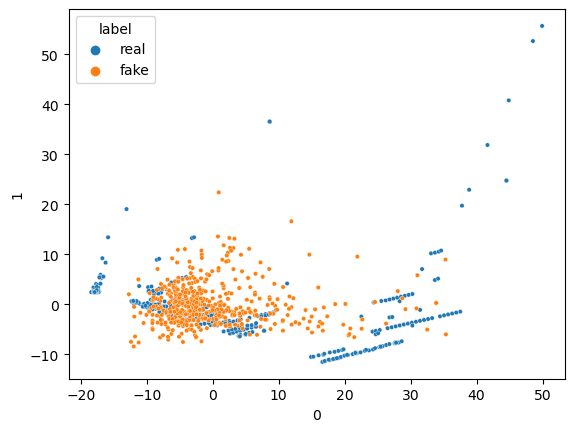

16/16 [==============================] - 0s 6ms/step


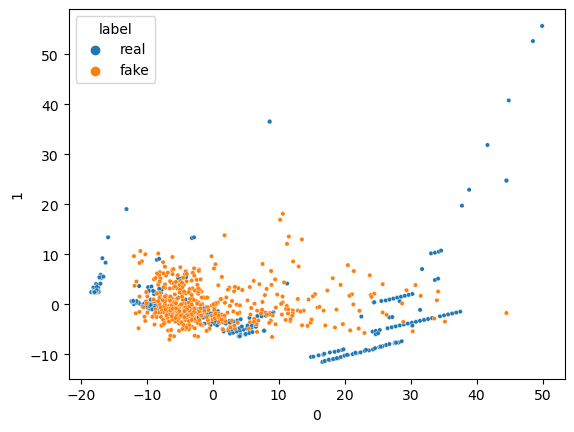

16/16 [==============================] - 0s 937us/step


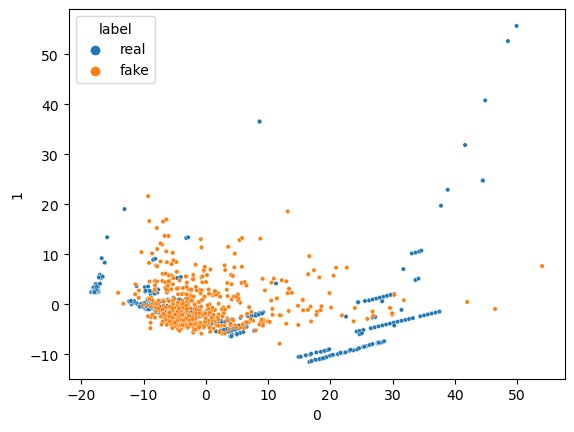

16/16 [==============================] - 0s 856us/step


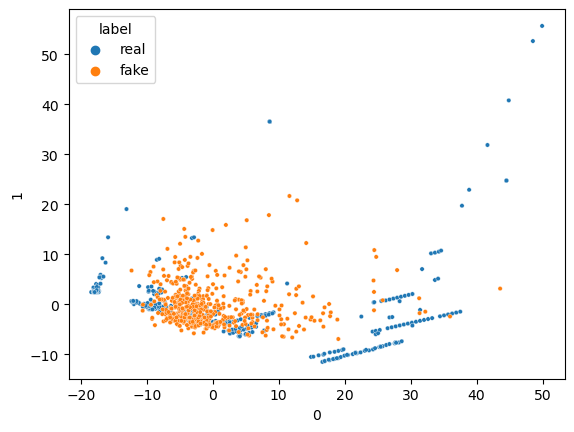

16/16 [==============================] - 0s 827us/step


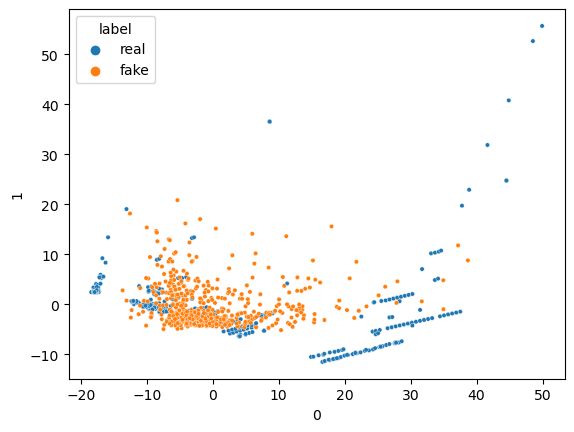

16/16 [==============================] - 0s 991us/step


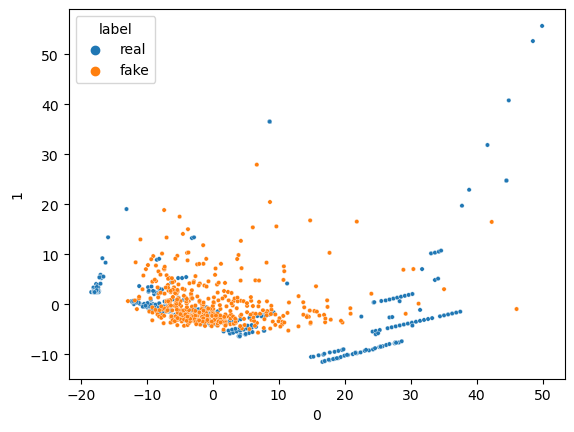

16/16 [==============================] - 0s 820us/step


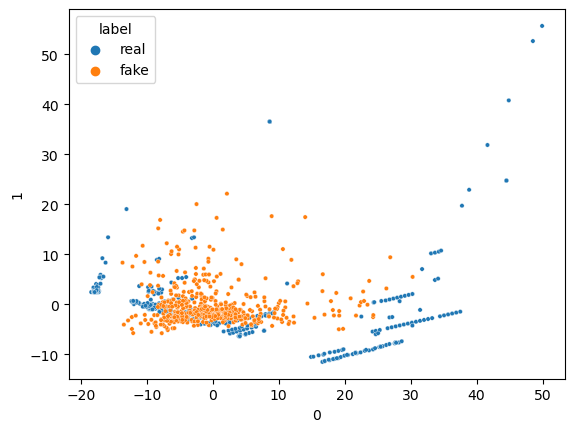

16/16 [==============================] - 0s 831us/step


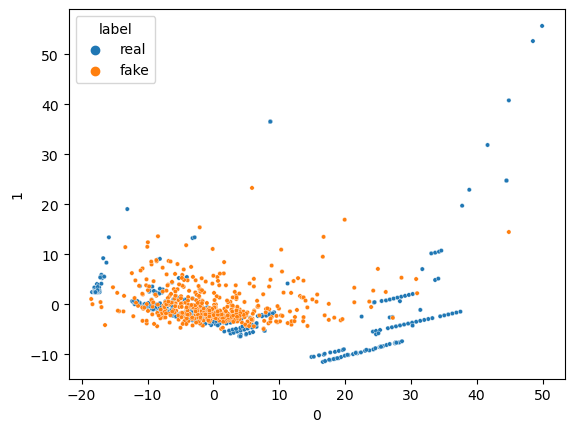

16/16 [==============================] - 0s 6ms/step


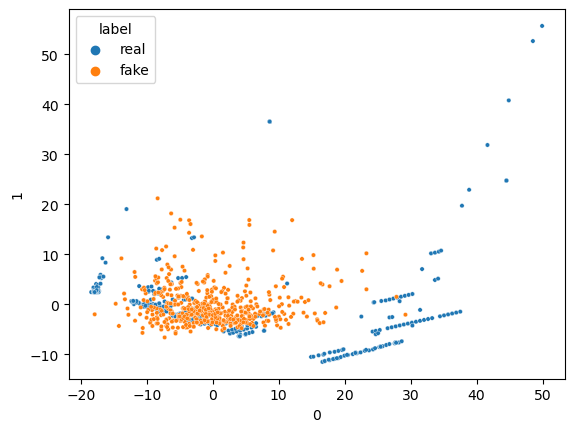

16/16 [==============================] - 0s 6ms/step


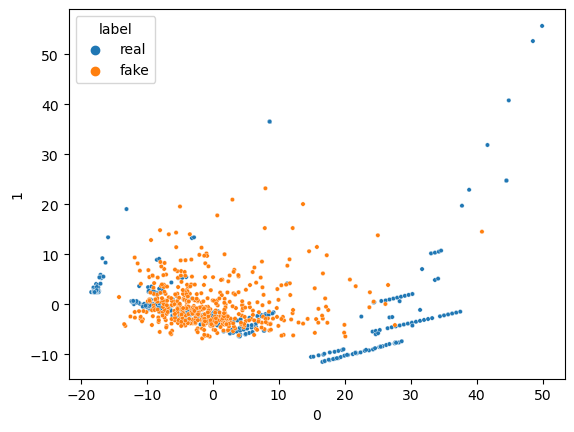

16/16 [==============================] - 0s 857us/step


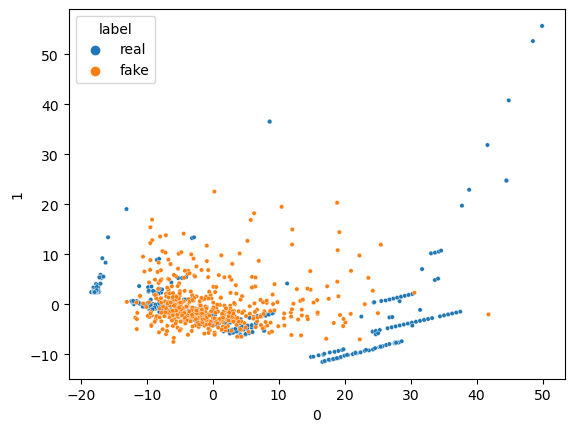

16/16 [==============================] - 0s 913us/step


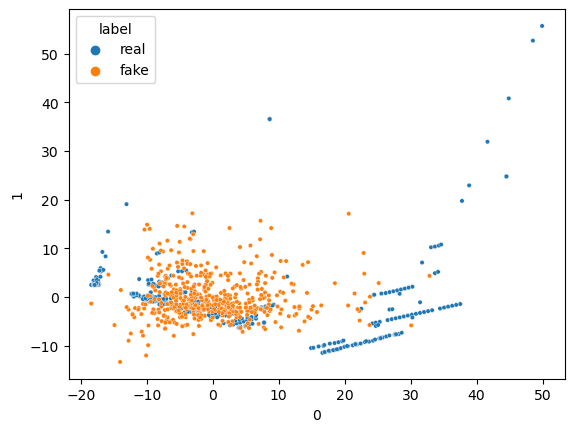

16/16 [==============================] - 0s 766us/step


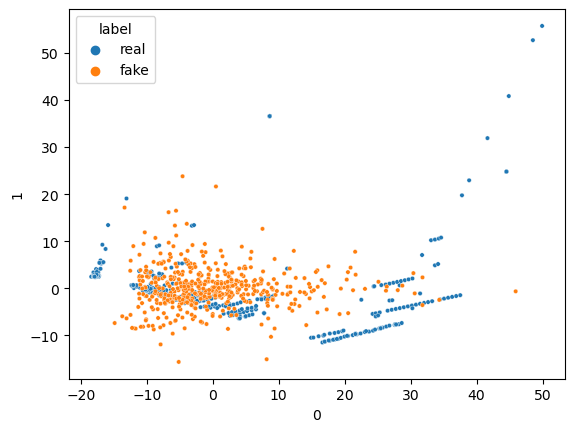

16/16 [==============================] - 0s 6ms/step


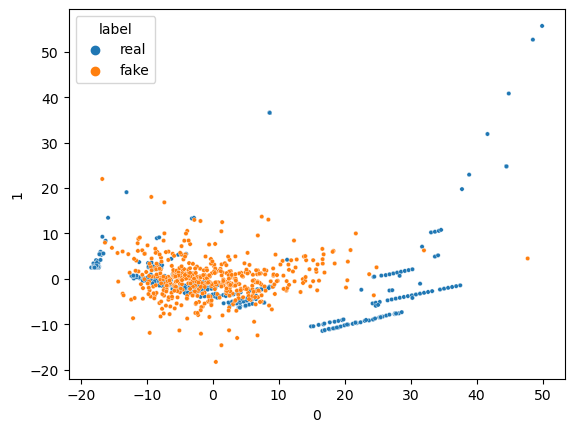

16/16 [==============================] - 0s 838us/step


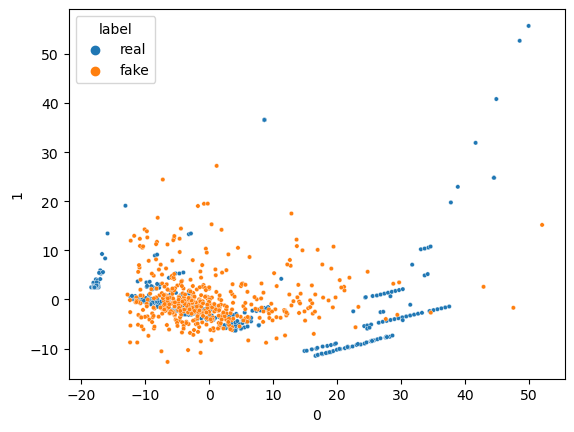

16/16 [==============================] - 0s 6ms/step


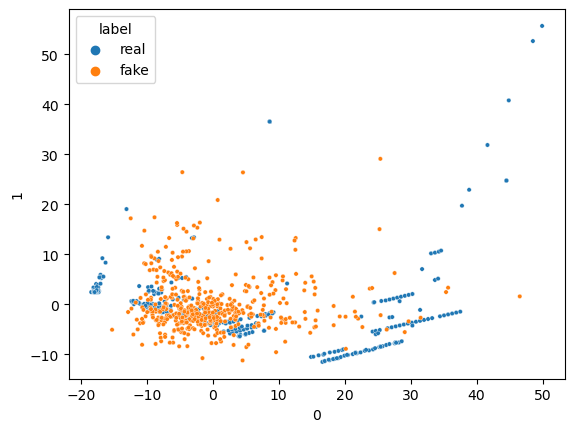

16/16 [==============================] - 0s 1ms/step


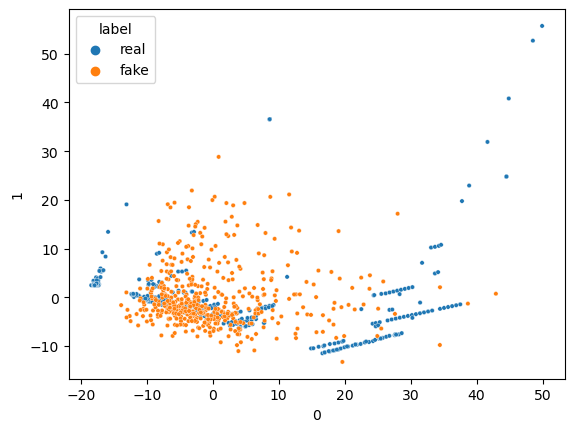

16/16 [==============================] - 0s 6ms/step


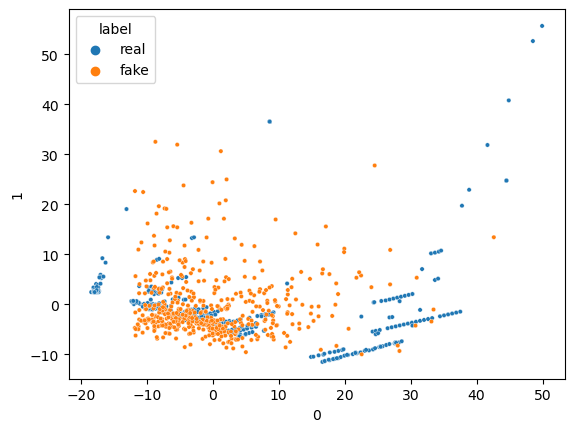

16/16 [==============================] - 0s 6ms/step


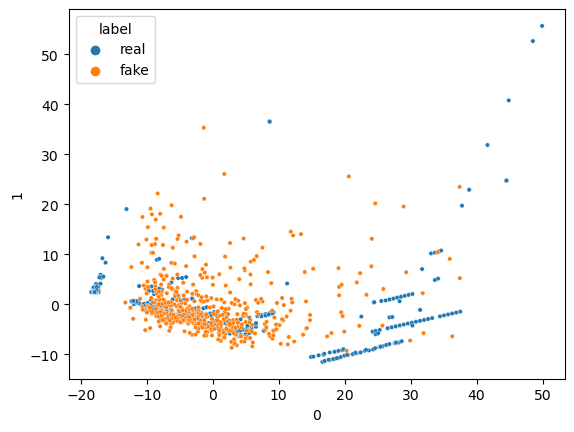

16/16 [==============================] - 0s 6ms/step


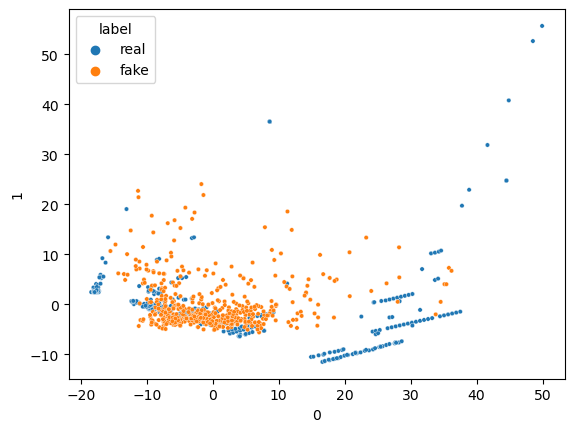

16/16 [==============================] - 0s 918us/step


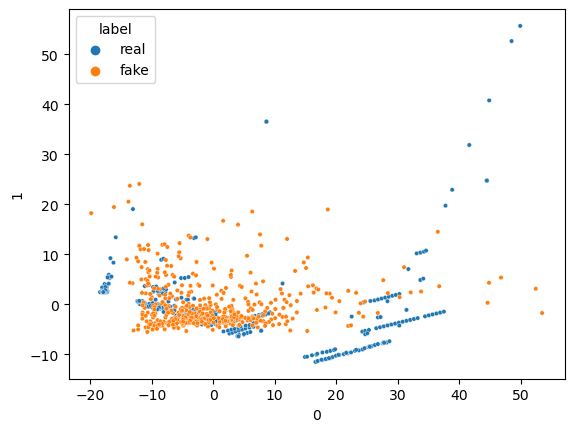

16/16 [==============================] - 0s 858us/step


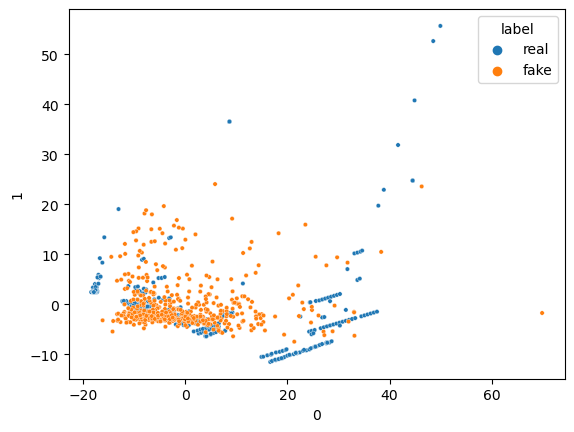

16/16 [==============================] - 0s 6ms/step


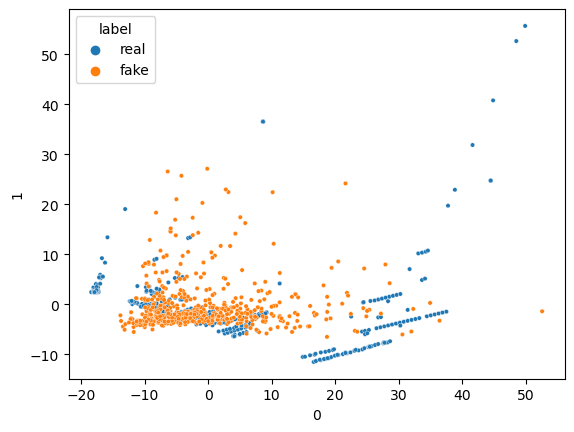

16/16 [==============================] - 0s 6ms/step


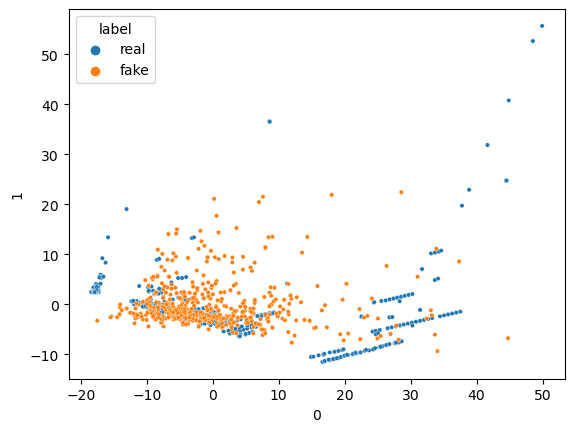

16/16 [==============================] - 0s 856us/step


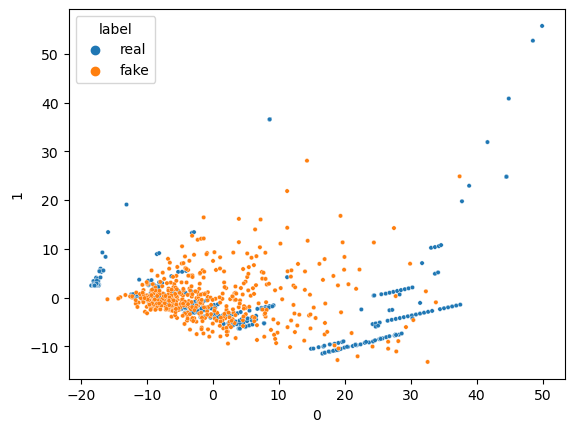

16/16 [==============================] - 0s 6ms/step


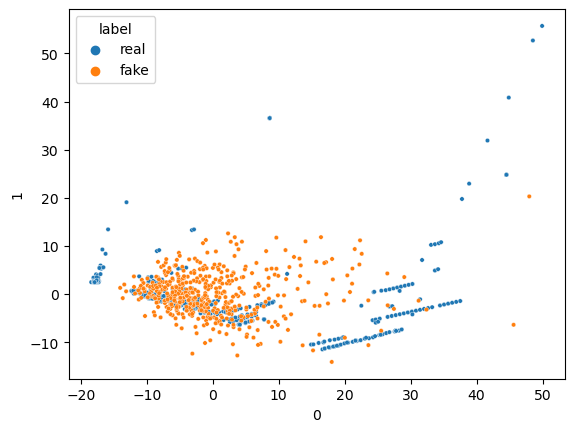

16/16 [==============================] - 0s 823us/step


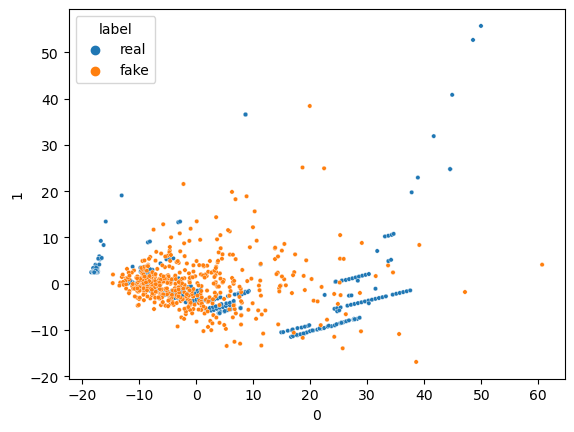

16/16 [==============================] - 0s 834us/step


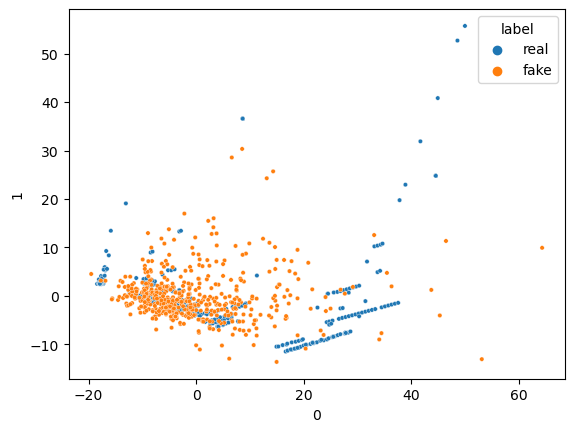

16/16 [==============================] - 0s 830us/step


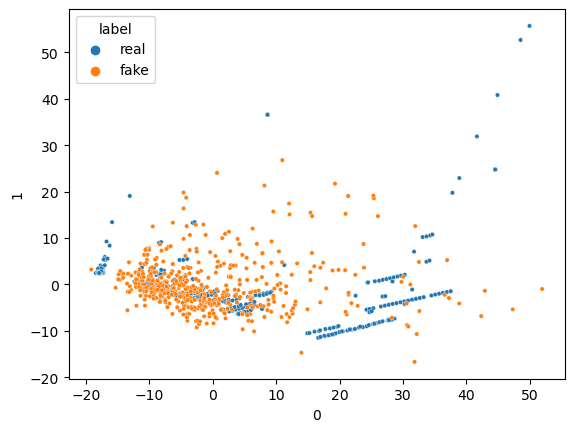

16/16 [==============================] - 0s 6ms/step


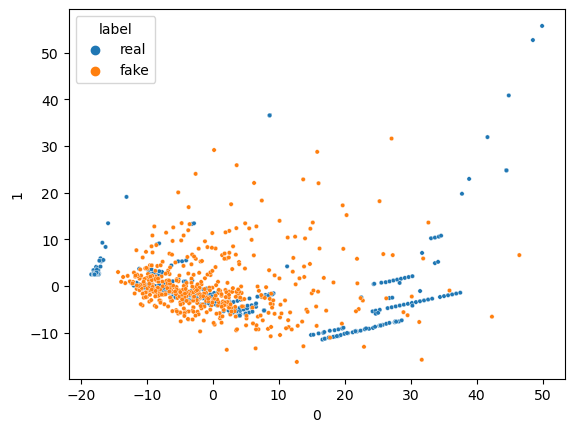

16/16 [==============================] - 0s 817us/step


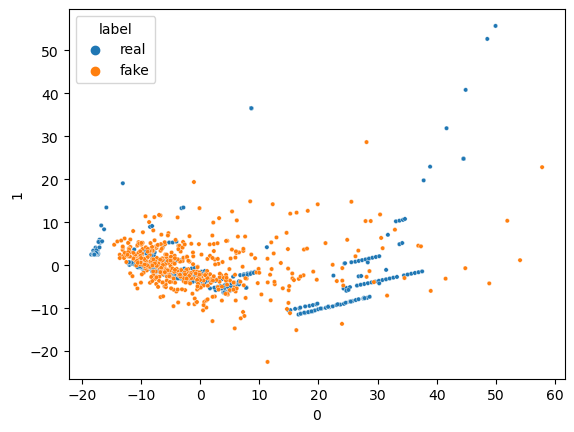

16/16 [==============================] - 0s 845us/step


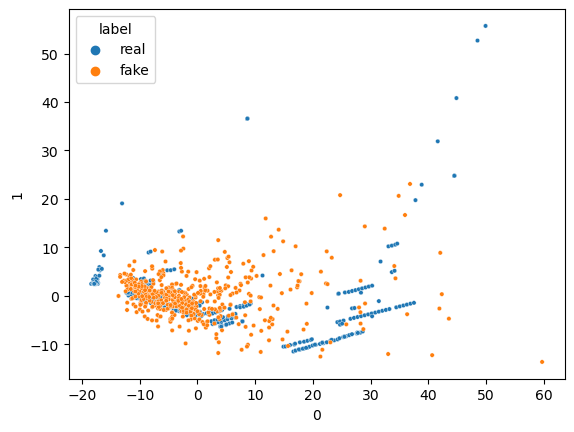

16/16 [==============================] - 0s 819us/step


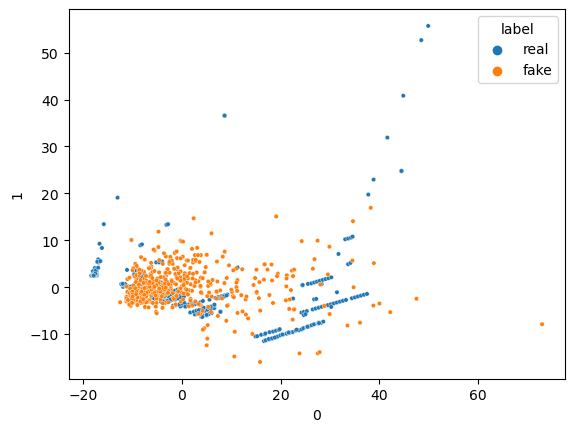

16/16 [==============================] - 0s 934us/step


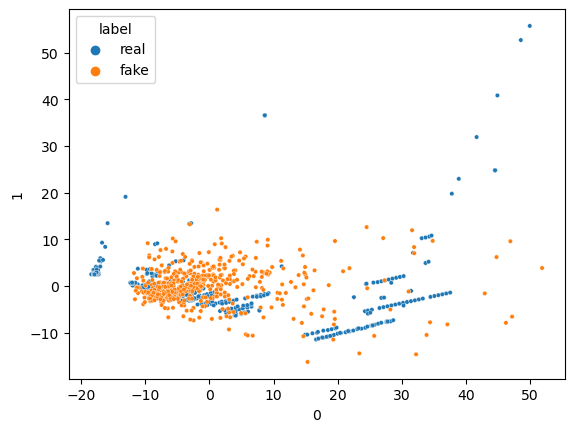

16/16 [==============================] - 0s 838us/step


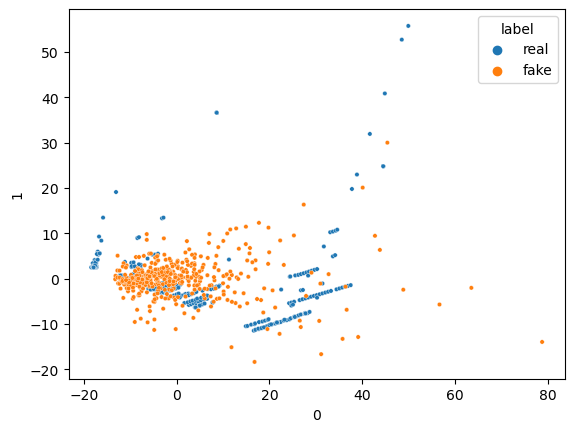

16/16 [==============================] - 0s 869us/step


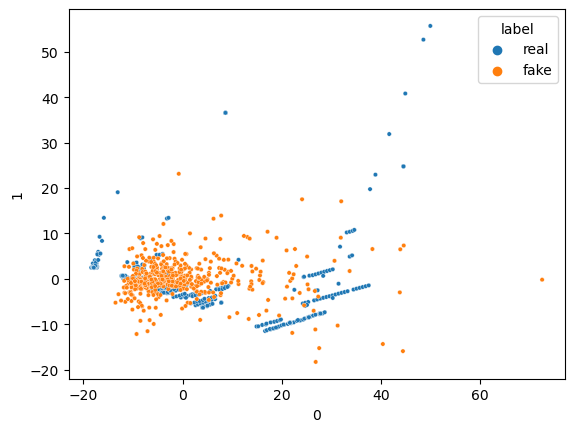

16/16 [==============================] - 0s 6ms/step


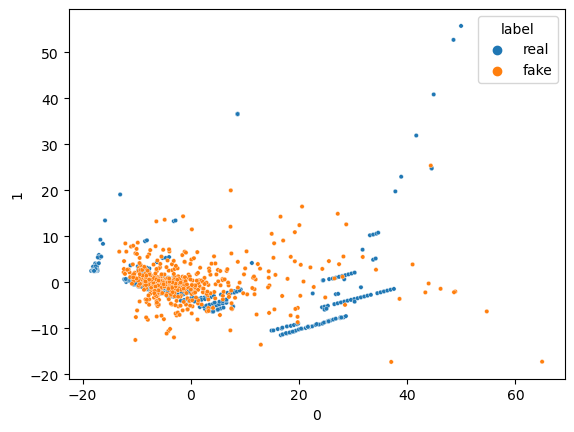

16/16 [==============================] - 0s 6ms/step


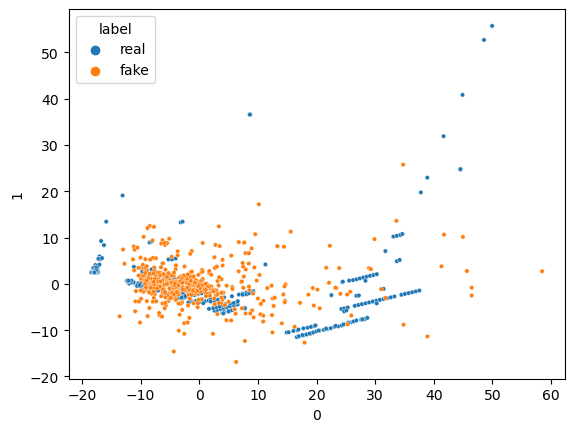

16/16 [==============================] - 0s 1ms/step


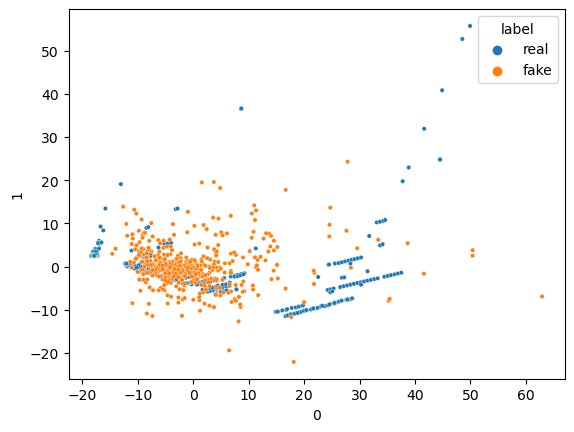

16/16 [==============================] - 0s 851us/step


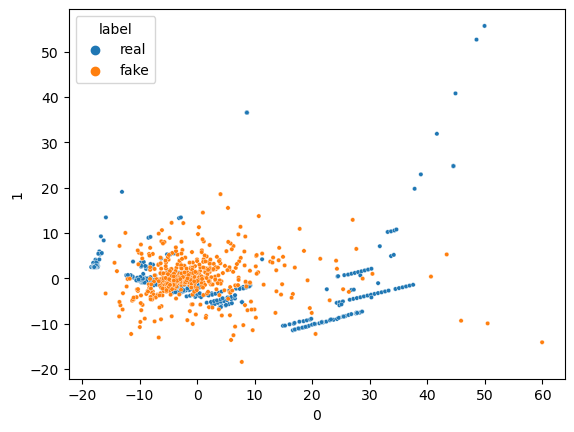

1/1 [==============================] - 0s 17ms/step


In [44]:
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
gan.compile(optimizer ='adam', loss = 'binary_crossentropy')

num_epochs = 1000
batch_size = 64
half_batch = int(batch_size/2)

for epoch in range(num_epochs):
    X_fake = generate_synthetic_data(generator, half_batch)
    y_fake = np.zeros((half_batch, 1))
    
    X_real = df_fraud.drop("Class", axis = 1).sample(half_batch)
    y_real = np.ones((half_batch, 1))
    
    discriminator.trainable = True
    discriminator.train_on_batch(X_real, y_real)
    discriminator.train_on_batch(X_fake, y_fake)
    
    noise = np.random.normal(0,1,(batch_size, 29))
    gan.train_on_batch(noise, np.ones((batch_size, 1)))
    
    if epoch%10 == 0:
        monitor_generator(generator)

### Task 7 - Generate synthetic data using the trained Generator

*   Generate 1000 fradulent data points using the trained generator
*   Compare the distribution of `real` and `synthetic` fradulent data points.


In [49]:
synthetic_data = generate_synthetic_data(generator,1000)
syn_df = pd.DataFrame(synthetic_data)

syn_df['label'] = 'fake'
print(syn_df.head())

old_df = df_fraud.drop('Class', axis=1)
old_df['label'] = 'real'
print(old_fake.head())

old_df.columns = syn_df.columns

combined_df= pd.concat([syn_df,old_df])
print(combined_df.head())

32/32 [==============================] - 0s 820us/step
          0         1         2         3         4         5         6  \
0  0.683889  2.125631 -4.732468  3.935539  0.937937  0.040566 -2.140725   
1  1.360490  1.312068 -2.863715  3.397871  1.550188  0.436569 -0.384195   
2 -2.101723  0.933361 -1.870503  2.413999 -1.623466 -1.410143 -0.752964   
3 -0.642132  1.192816 -1.614247  2.912798 -0.748989  0.196655 -0.516824   
4 -3.547181  1.465901 -3.898302  1.464993 -2.100084 -0.979501 -3.510895   

          7         8         9  ...        20        21        22        23  \
0  1.499752 -1.953017 -3.372778  ... -0.121684 -0.275096  1.289672 -0.845311   
1  0.212872 -0.897302 -0.640457  ...  0.008030 -0.567087  1.412860 -1.961937   
2  0.129428 -1.626065 -2.464306  ...  0.203709  0.223503 -0.182087  0.269290   
3 -0.911538 -1.843266 -1.153832  ...  0.292004  0.122322 -0.221387 -0.296114   
4  1.004653 -1.396469 -5.144375  ... -0.250429  0.482909  0.115748  0.818527   

         24  

Checking the individual feature distribution of `synthetic` and `real` fraud data.

In [50]:
for col in combined_df.columns:
  plt.figure()
  fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
  fig.show()

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>